In [1]:
from pathlib import Path
import os
from multiprocessing import Pool
import multiprocessing
import time

# JAX configurations
os.environ["OMP_NUM_THREADS"] = "1"
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['XLA_PYTHON_CLIENT_ALLOCATOR']='platform'


import jax
import jax.numpy as jnp
# jax.config.update("jax_enable_x64", True)
jax.config.update('jax_default_device', jax.devices('gpu')[-1])


import emcee
import jax

import numpy as np
import equinox as eqx
import h5py


import matplotlib.pyplot as plt
import numpyro
from numpyro import distributions as dist, infer

# Defining artificial data

In [2]:
TESTING_DATA_FILE = Path("../../outputs/poisson_pressure_simulations_test.h5")

with h5py.File(TESTING_DATA_FILE, "r") as f:
    print(f.keys())
    X = jnp.array(f["positions"])
    T = jnp.array(f["kl_transform_matrice"])


P_ref_file = Path("../../raw_data/pressure_ref.dat")
Y_ref_file = Path("../../raw_data/YS_ref.dat")

P_ref = jnp.array(np.loadtxt(P_ref_file))
Y_ref = jnp.array(np.loadtxt(Y_ref_file))

pos  = [255, 755, 1255, 1755, 2255,  265,  765, 1265, 1765, 2265,  275, 775,
        1275, 1775, 2275,  285,  785, 1285, 1785, 2285,  295,  795, 1295, 1795, 2295]

X_ref = X[pos, :]

SIGMA = 0.5

<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>


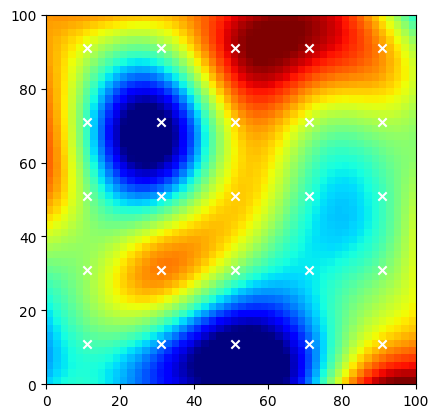

In [3]:
plt.imshow(Y_ref.reshape(50, 50), cmap="jet", origin="lower", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
plt.scatter(*X_ref.T, marker="x", c="w")

# Interval creation function

In [4]:
DATA_FILE = Path("../../outputs/poisson_pressure_simulations.h5")

with h5py.File(DATA_FILE, "r") as f:
    print(f.keys())
    theta = jnp.array(f["kl_coefficients"])

<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>


In [5]:
def generate_intervals():
    min_, max_ = theta.min(axis=0), theta.max(axis=0)
    intervals = [(float(mi), float(ma)) for mi, ma in zip(min_, max_)]

    return intervals, min_, max_

INTERVALS, MIN, MAX = generate_intervals()

MIN, MAX

(Array([-4.133799 , -4.4780173, -4.4256234, -4.344691 , -4.465861 ,
        -5.003207 , -4.6752343, -4.063142 , -3.9797022, -4.084783 ,
        -4.301813 , -3.9780731, -4.853323 , -4.5483127, -4.579231 ,
        -4.435594 , -4.527643 , -4.194682 , -4.4632397, -4.656494 ,
        -4.451278 , -4.431556 , -4.2111244, -4.596984 ], dtype=float32),
 Array([4.1295114, 4.6543264, 3.8184648, 4.4239864, 4.4186835, 4.7119555,
        4.346513 , 3.8344748, 4.9299054, 4.2323565, 4.3842645, 4.2754087,
        4.1166024, 4.200948 , 3.9405203, 4.1797338, 4.5421233, 4.5354877,
        4.1899757, 4.101758 , 4.0647583, 4.3309145, 4.366222 , 4.010905 ],      dtype=float32))

In [6]:
def generate_initial_guess_normal(key):

    guesses = []
    for a, b in zip(MIN, MAX):
        key, key_k = jax.random.split(key)
        guess = jax.random.normal(key_k)*(a-b)/6 + (a+b)/2
        guesses.append(guess)
    

    return jnp.array(guesses)

def generate_initial_guess_uniform(key):

    guesses = []
    for a, b in zip(MIN, MAX):
        key, key_k = jax.random.split(key)
        guess = jax.random.uniform(key_k, minval=a, maxval=b)
        guesses.append(guess)
    

    return jnp.array(guesses)

# Loading DeepONet

In [7]:
from typing import Callable

class DeepOnet(eqx.Module):
    branch_net: eqx.nn.MLP
    trunk_net: eqx.nn.MLP
    bias: jax.Array

    def __init__(
        self, 
        in_branch: int,
        in_trunk: int,
        width: int,
        depth: int,
        interact: int,
        activation: Callable,
        *,
        key
    ):
        """
        Simplified deeponet using twin hidden architectures
        """

        b_key, t_key = jax.random.split(key)

        self.branch_net = eqx.nn.MLP(
            in_branch,
            interact,
            width,
            depth,
            activation,
            key=b_key
        )

        self.trunk_net = eqx.nn.MLP(
            in_trunk,
            interact,
            width,
            depth,
            activation,
            final_activation=activation,
            key=b_key
        )

        self.bias = jnp.zeros((1,))

    
    def __call__(self, x_branch, x_trunk):
        """
        x_branch.shape = (in_size_branch,)
        x_trunk.shape = (1,)

        return shape: "scalar"
        """

        branch_out = self.branch_net(x_branch)
        trunk_out = self.trunk_net(x_trunk)

        inner_product = jnp.sum(branch_out*trunk_out, keepdims=True)

        return (inner_product + self.bias)[0]




In [8]:
key = jax.random.key(1325)
# key = jax.random.key(6757)

deeponet = DeepOnet(
    24,
    2,
    256,
    5,
    128,
    activation=jax.nn.relu,
    key=key
)

deeponet = eqx.tree_deserialise_leaves("../../outputs/fivespot_deeponet_best.eqx", deeponet)

# Defining NumPyro Model

Let's now use NumPyro model definition language to define our model! Rembembering our parameters are $(k, \beta, x_0, v_0)$. Let's again just define their priors over a uniform grid on the parameter space on which the model was trained on!

In [9]:
def probabilistic_model(x, yerr, y=None):

    # k = numpyro.sample("k", dist.Uniform(0.0, 5.0)) 
    # beta = numpyro.sample("beta", dist.Uniform(0.0, 5.0))
    # x0 = numpyro.sample("x0", dist.Uniform(0.0, 5.0))
    # v0 = numpyro.sample("v0", dist.Uniform(0.0, 5.0))
    vars_ = []

    for i, a, b in zip(range(1, len(MIN)+1), MIN, MAX):
        var = numpyro.sample(f"theta_{i}", dist.Uniform(a, b))
        vars_.append(var)
        

    out = jax.vmap(deeponet, in_axes=(None, 0))(jnp.array(vars_), x)

    with numpyro.plate("data", len(x)):
        numpyro.sample("y", dist.Normal(out, yerr), obs=y)

In [10]:
sampler = infer.MCMC(
    infer.NUTS(probabilistic_model),
    num_warmup=500,
    num_samples=100_000,
    num_chains=2,
    # progress_bar=True,
)


sampler.run(jax.random.key(0), X_ref, SIGMA, y=P_ref)

  0%|          | 0/100500 [00:00<?, ?it/s]

  0%|          | 0/100500 [00:00<?, ?it/s]

In [15]:
# labels = ["   k", "beta", "  x0", "  v0"]
labels = [f"theta_{i}" for i in range(1, 25)]
flat_samples = np.array([sampler.get_samples()[l.strip()] for l in labels]).T


# fitted  = flat_samples.mean(axis=0).tolist()
# ref_vals = [k, beta, x0, v0]

# print("Reference Vals vs Fitted Values\n")

# for fit, ref, par in zip(fitted, ref_vals, labels):
#     print(f"{par} - ref: {ref:5.2f} - fit: {fit:5.2f}")

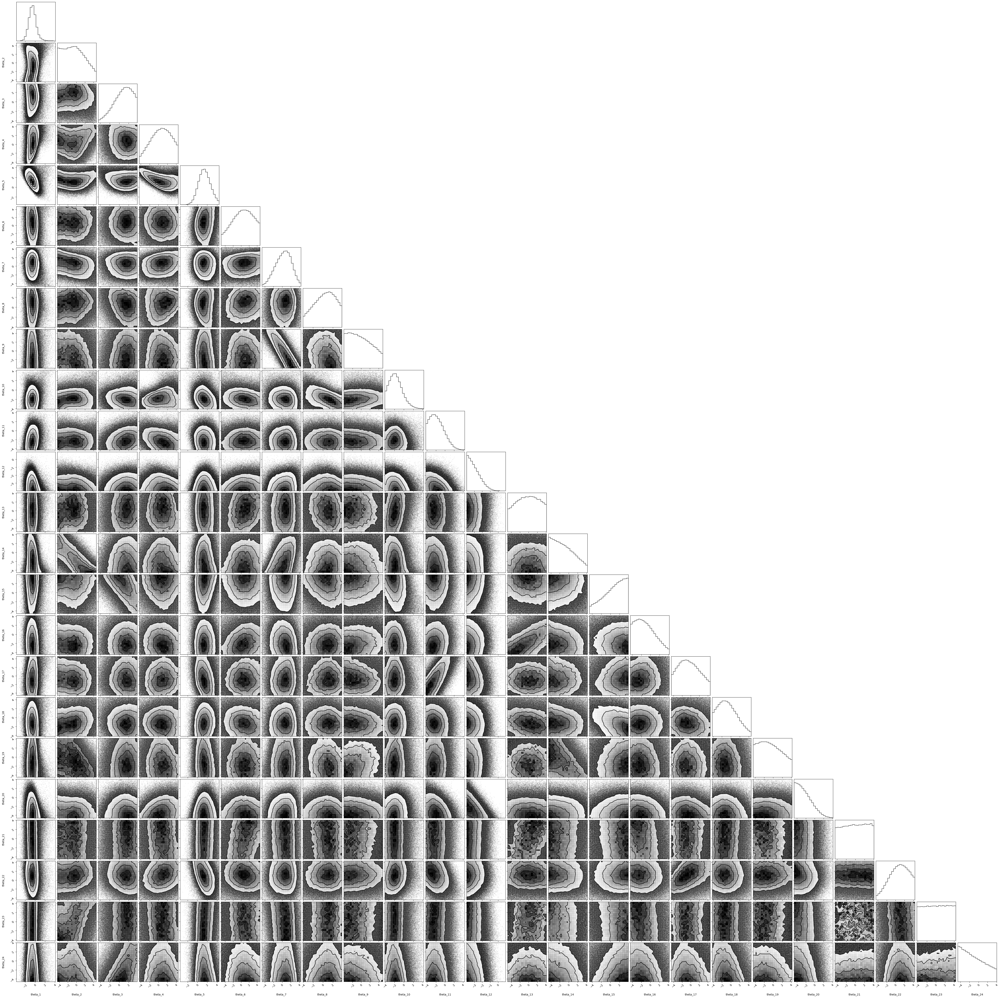

In [19]:
import corner
labels = [f"theta_{i}" for i in range(1, 25)]

fig = corner.corner(
    flat_samples, labels=labels, 
);

fig.savefig("posteriors_numpyro_low-dpi.png", dpi=25)

[Text(0.5, 1.0, 'Recovered'), Text(0.5, 0, 'X'), None]

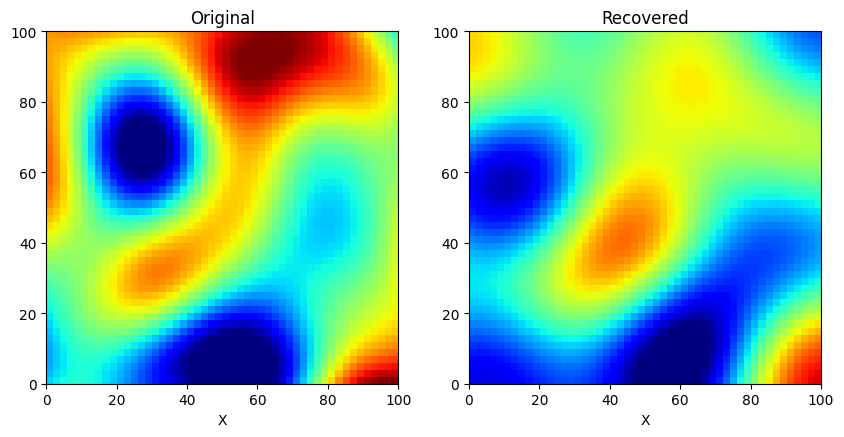

In [14]:

fitted  = flat_samples.mean(axis=0)

Y_recovered = (T@(fitted.reshape(-1, 1))).ravel().reshape(50, 50)

fig, [ax1, ax2] = plt.subplots(ncols=2, figsize=(10, 5))

ax1.imshow(Y_ref.reshape(50, 50), cmap="jet", origin="lower", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
ax1.set(title="Original", xlabel="X")
# ax1.scatter(*X_ref.T, marker="o", c="w", edgecolors="k")

ax2.imshow(Y_recovered, origin="lower", cmap="jet", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
ax2.set(title="Recovered", xlabel="X", label="Y")
# ax2.scatter(*X_ref.T, marker="o", c="w", edgecolors="k")